# 01 - Análisis exploratorio

Se realiza un análisis exploratorio cualitativo de los datos. Calcula los valores promedio de las cantidades físicas solicitadas de un año típico en Mérida (por intervalos de 5 minutos para cada día del año) utilizando la información de las tres bases de datos metereológicos (del 2018 al 2020)

## Importamos librerías que nos auxiliarán en el análisis por realizar

In [1]:
# Procesado y visualización de datos
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import matplotlib.dates as dates
import matplotlib.ticker as ticker
import calendar

In [2]:
# Crear dataframe con los sets de datos de NREL
import utils.nrel_system.parse_nrel as parse_nrel

## Crear DataFrame inicial de datos empíricos

Con el módulo _parse_nrel_ extraeremos la información de nuestros sets de datos y los vertimos en un dataframe único que nos auxiliará en el estudio de los mismos en forma de series de tiempo

**_VARIABLES EMPÍRICAS_**
- **TEMPERATURE**: Temperatura en grados centígrados
- **DHI**: Diffuse Horizontal Irradiance
- **DNI**: Direct Normal Irradiance
- **GHI**: Global Horizontal Irradiance
- **SOLAR_ZENITH_ANGLE**: Ángulo entre el zenith y el plano solar


In [3]:
# Definir la ruta a archivos CSV que almacenan los sets de datos descargados para este análisis energético solar
datasetList = [
    "data/mx-merida/2018.csv",
    "data/mx-merida/2019.csv",
    "data/mx-merida/2020.csv"
]

# Estos son los datos de interés recuperados de los sets de datos descargados
nrel, L = parse_nrel.main(datasetList)
nrel.head()

,YEAR,MONTH,DAY,HOUR,MINUTE,DHI,DNI,TEMPERATURE,GHI,SOLAR_ZENITH_ANGLE
0,2018,1,1,0,0,0,0,23.3,0,177.92
1,2018,1,1,0,5,0,0,23.2,0,177.83
2,2018,1,1,0,10,0,0,23.2,0,177.21
3,2018,1,1,0,15,0,0,23.2,0,176.33
4,2018,1,1,0,20,0,0,23.2,0,175.32


## Calcular variables físicas adicionales

Después de haber recuperado los datos de interés iniciales, inyectamos las siguientes columnas que nos auxiliarán en el cálculo de recurso energético solar en la locación elegida:


**_VARIABLES GEOMÉTRICAS_**
- **MINS_SINCE_EQUINOX**: Número de minutos que han pasado desde el último equinoccio. El conteo se reinicia cada 21 de diciembre.
- **Z**: Es el la misma columna que **SOLAR_ZENITH_ANGLE** con el nombre cambiado; cambio de nombre hecho por practicidad.
- **D**: Ángulo declinación solar. Depende de la columna **MINS_SINCE_EQUINOX**.
- **H**: Ángulo hora. Depende de las columnas **HOUR** y **MINUTE**.
- **A**: Ángulo azimutal. Desde el punto de vista del observador, indica el ángulo entre la posición del sol y el sur. Depende de las columnas **D** y **H** y de la latitud **L** del observador
- **ALPHA**: Ángulo altura solar. Desde el punto de vista del observador, indica el ángulo entre el plano tangente a la tierra (en el que se encuentra el observador) y la posición del sol. Depende de la columna **Z** (o **SOLAR_ZENITH_ANGLE**).

**_VARIABLES DE IRRADIANCIA_**
- **X_DIF**: Cálculo de componente difusa de irradiancia solar. Depende de columnas **DNI** y **DHI**.
- **X_DIR**: Cálculo de componente directa de irradiancia solar. Depende de columnas **DNI** y **DHI**.
- **GI**: Cálculo de irradiancia directa global; interprétese como la irradiancia emitida por una fuente esférica (el sol). Depende de columnas **GHI**, **X_DIF** y **X_DIR**.

In [4]:
# Calcular (e inyectar) variables de temporales, de geometría solar y valores de irradiancia por componentes difusa y directa
import utils.physical_system.setup_variables as setup_variables

nrel = setup_variables.main(nrel,L)
nrel.head()

,YEAR,MONTH,DAY,HOUR,MINUTE,MINS_SINCE_EQUINOX,TEMPERATURE,DNI,DHI,GHI,GI,X_DIF,X_DIR,Z,D,H,A,ALPHA
0,2018,1,1,0,0,15840.0,23.3,0,0,0,0.0,0.0,0.0,177.92,-23.06,0.0,0.0,0.0
1,2018,1,1,0,5,15845.0,23.2,0,0,0,0.0,0.0,0.0,177.83,-23.06,0.0,0.0,0.0
2,2018,1,1,0,10,15850.0,23.2,0,0,0,0.0,0.0,0.0,177.21,-23.06,0.0,0.0,0.0
3,2018,1,1,0,15,15855.0,23.2,0,0,0,0.0,0.0,0.0,176.33,-23.06,0.0,0.0,0.0
4,2018,1,1,0,20,15860.0,23.2,0,0,0,0.0,0.0,0.0,175.32,-23.05,0.0,0.0,0.0


## Visualizamos y comprobamos el comportamiento repetitivo de **MINS_SINCE_EQUINOX**. 

Obtenemos las etiquetas con las que visualizaremos equinoccios e inicios de años en el eje horizontal:

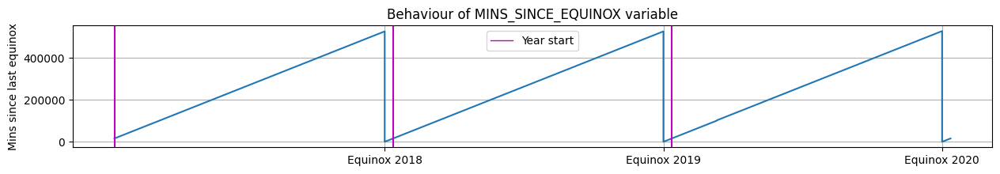

In [5]:
def get_MINS_SINCE_EQUINOX_xaxis_vars():
    # Get columns of interest only
    ticking_cols = ['YEAR','MONTH','DAY','HOUR','MINUTE','MINS_SINCE_EQUINOX']
    ticking = nrel.loc[(nrel.HOUR == 0)&(nrel.MINUTE == 0),ticking_cols]

    # Assign labels and filter 
    ticking['LABEL'] = ''
    ticking.loc[(ticking.MONTH == 12)&(ticking.DAY==21),'LABEL'] = 'Equinox ' + ticking.YEAR.astype(str) 
    ticking.loc[(ticking.MONTH == 1)&(ticking.DAY==1),'LABEL'] = 'Jan 1st ' 
    ticking = ticking.loc[(ticking.LABEL != '')]
    
    return ticking

def plot_MINS_SINCE_EQUINOX():
    # Generate horizontal axis ticks and labels
    xaxis_vars = get_MINS_SINCE_EQUINOX_xaxis_vars()
    ticking = xaxis_vars.loc[(xaxis_vars.MONTH == 12)&(xaxis_vars.DAY == 21),['LABEL']]
    years = xaxis_vars.loc[(xaxis_vars.MONTH == 1)&(xaxis_vars.DAY == 1),['YEAR']]
    
    # Plotting
    fig, ax = plt.subplots(figsize=(15,2))
    ax.plot(nrel.MINS_SINCE_EQUINOX.to_numpy())
    plt.ylabel('Mins since last equinox')
    plt.xticks(ticking.index, ticking.LABEL)
    ax.legend([Line2D([0], [0], color='m', lw=1)], ['Year start'], loc = 'upper center')
    for idx in years.index:
        plt.axvline(x = idx, color = 'm', label = years.loc[years.index == idx]['YEAR'].to_list()[0])
    ax.grid(True)
    plt.title('Behaviour of MINS_SINCE_EQUINOX variable')
    plt.show()

plot_MINS_SINCE_EQUINOX()

## Ahora visualizamos el comportamiento de diferentes variables por año

Nos damos a la tarea de graficar los datos utilizados para familiarizarnos visualmente con las series de tiempo con las que estaremos trabajando.

### **TEMPERATURE**

Empezamos con la variable de temperatura. Las curvas graficadas revelan que los datos tienen un comportamiento contínuo y que probablemente no haya valores inválidos de temperatura en la serie.

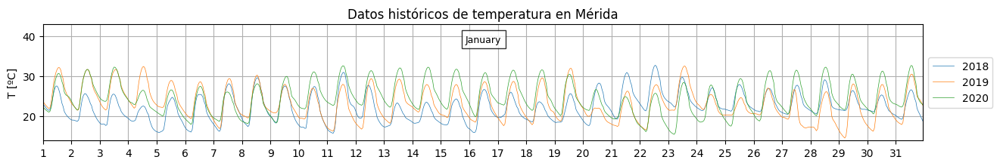

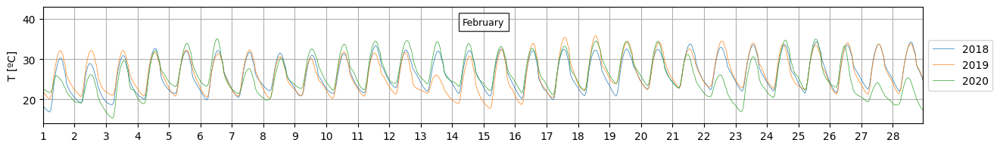

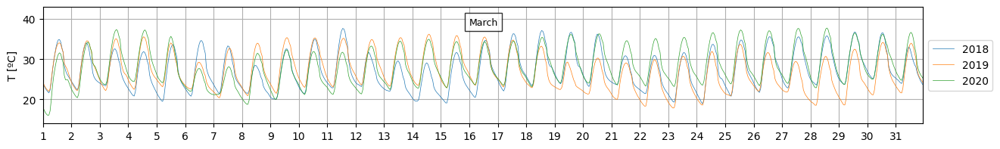

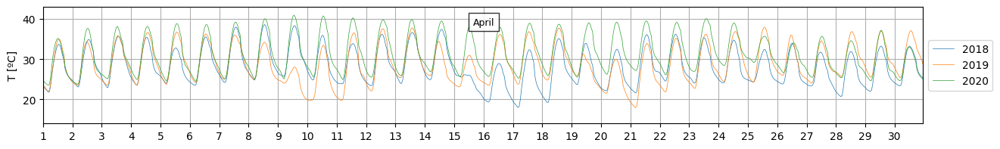

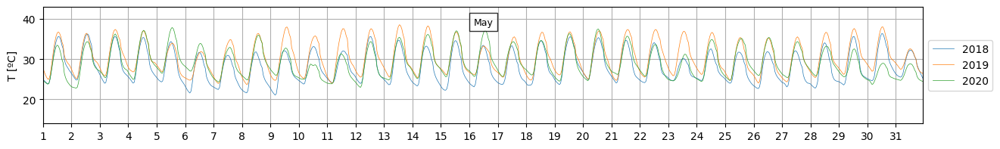

...

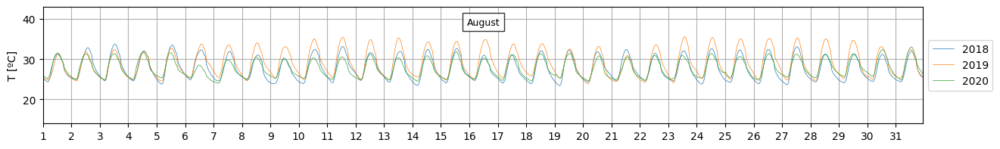

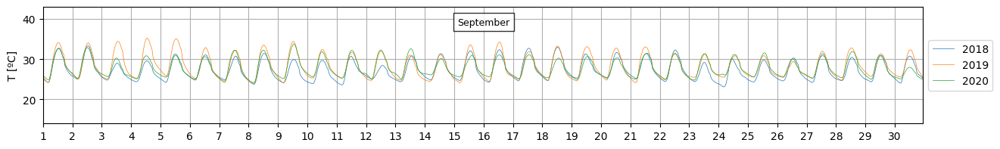

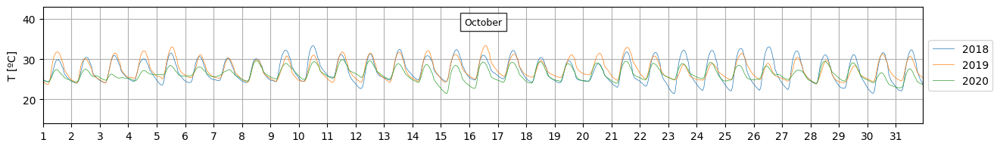

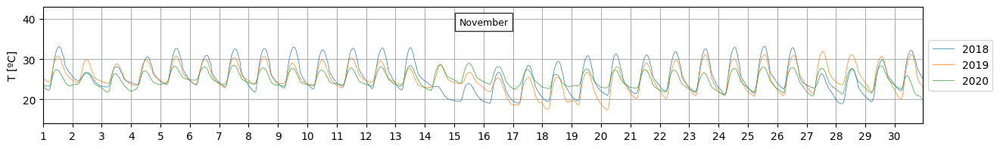

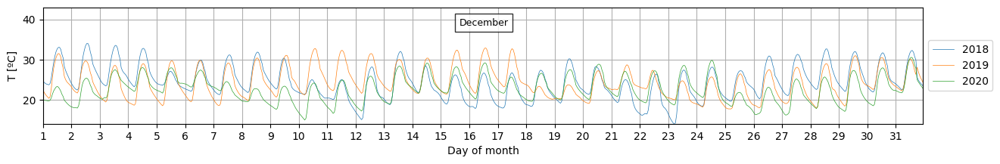

In [6]:

def plot_TEMPERATURE():

    temperature = nrel.groupby(['YEAR','MONTH','DAY','HOUR']).mean().reset_index()[['YEAR','MONTH','DAY','HOUR','TEMPERATURE']]
    years = temperature.YEAR.unique()
    ylimits = (14,43)
    
    for mo in temperature.MONTH.unique():
        
        fig, ax = plt.subplots(figsize=(15,2))
        if mo == 1:
            plt.title('Datos históricos de temperatura en Mérida')
        plt.ylim(ylimits)
        ax.grid(True)
        ax.margins(x=0)
        plt.ylabel('T [ºC]')

        ticking = temperature.loc[(temperature.HOUR == 0),['DAY']]

        plt.xticks(ticking.index, ticking.DAY)
        for yr in years:
            current = temperature.loc[(temperature.YEAR == yr)&(temperature.MONTH == mo)].reset_index()
            ax.plot(current.index,current.TEMPERATURE,label=str(yr),linewidth=0.5)

        plt.text(
            len(current.index)/2, 
            np.max(ylimits)*0.94, 
            str(calendar.month_name[mo]),  
            bbox = dict(facecolor = 'white', alpha = 0.8),
            horizontalalignment='center',
            verticalalignment='top',
            fontsize=9
        )
            
        plt.legend(loc="center left",bbox_to_anchor=(1, 0.5))
    plt.xlabel('Day of month')
    plt.show()

plot_TEMPERATURE()

### **DHI**

En general parece razonable intuir que los valores de irradiancia difusa horizontal tienen una curva mejor comportada durante los periodos diurnos en donde casi no hay nubes y el cielo se encuentra despejado. Estas condiciones ayudan a que la irradiancia global dependan en su totalidad de las variables geométricas temporales del sistema. 

Los periodos diurnos en que el comportamiento de la irradiancia difusa horizontal es más errático y contiene picos más pronunciados es durante los periodos en que los cielos se encuentran obstruidos. En general, podemos intuir que mientras mayor sea el pico, menos despejados se encontraban los cielos por lo que la componente difusa de la irradiancia global aumenta.

Sin embargo, no debemos pasar por alto que esto solo tiene sentido mientras que un cielo poco despejado no impida la tramisión difusa de luz. Bajo este tren de pensamiento, es de esperarse que en los periodos diurnos en que existían condiciones climáticas de precipitaciones fuertes, el comportamiento de la irradiancia difusa horizontal sea ambos errático y de baja intensidad.

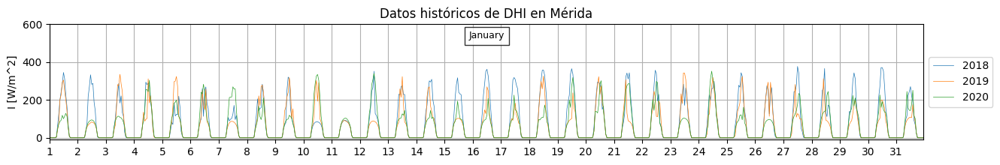

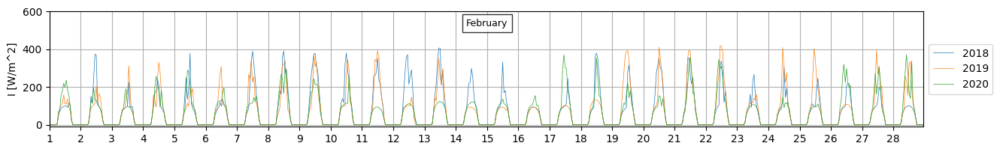

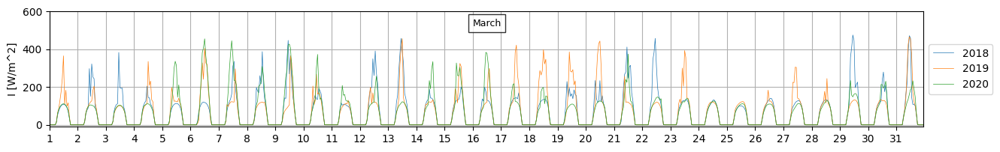

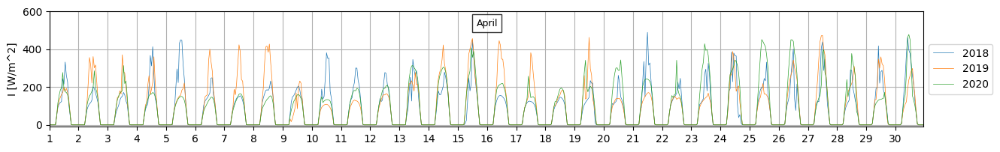

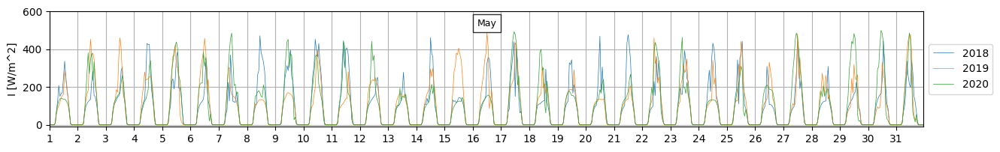

...

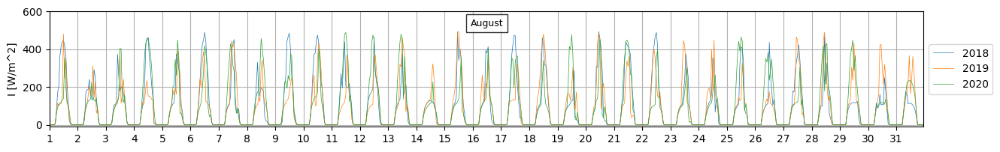

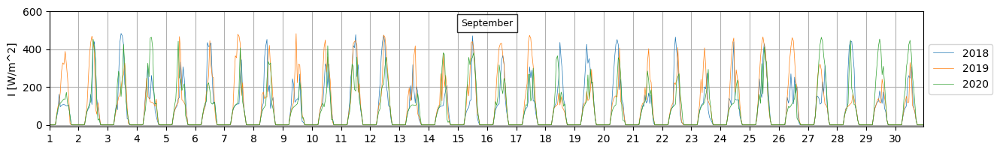

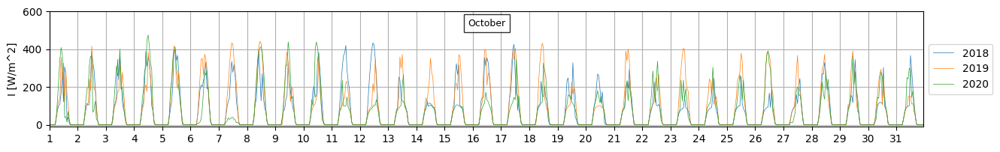

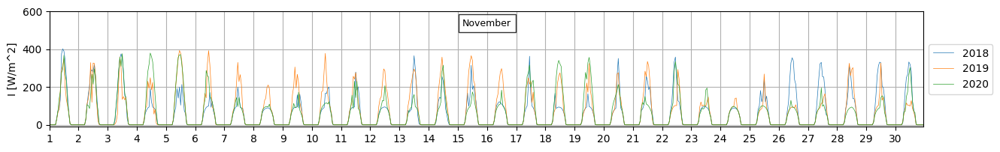

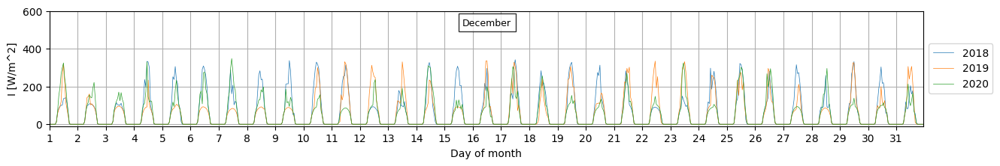

In [7]:
import calendar

def plot_DHI():

    temperature = nrel.groupby(['YEAR','MONTH','DAY','HOUR']).mean().reset_index()[['YEAR','MONTH','DAY','HOUR','DHI']]
    years = temperature.YEAR.unique()
    ylimits = (-10,600)
    
    for mo in temperature.MONTH.unique():
        
        fig, ax = plt.subplots(figsize=(15,2))
        if mo == 1:
            plt.title('Datos históricos de DHI en Mérida')
        plt.ylim(ylimits)
        ax.grid(True)
        ax.margins(x=0)
        plt.ylabel('I [W/m^2]')

        ticking = temperature.loc[(temperature.HOUR == 0),['DAY']]

        plt.xticks(ticking.index, ticking.DAY)
        for yr in years:
            current = temperature.loc[(temperature.YEAR == yr)&(temperature.MONTH == mo)].reset_index()
            ax.plot(current.index,current.DHI,label=str(yr),linewidth=0.5)

        plt.text(
            len(current.index)/2, 
            np.max(ylimits)*0.94, 
            str(calendar.month_name[mo]),  
            bbox = dict(facecolor = 'white', alpha = 0.8),
            horizontalalignment='center',
            verticalalignment='top',
            fontsize=9
        )
            
        plt.legend(loc="center left",bbox_to_anchor=(1, 0.5))
    plt.xlabel('Day of month')
    plt.show()

plot_DHI()

### **DNI**

Los valores de irradiancia directa normal son más altos en general que los de irradiancia difusa horizontal dado que en la locación elegida hay suelos despejados la mayor parte del tiempo. 

De nuevo, el comportamiento es contínuo durante los periodos diurnos con cielos despejados y erráticos durante los periodos de cielos no despejados. A diferencia de la variable anteriormente comentada, la intensidad de la irradiancia directa normal disminuye cuando los cielos no están despejados, pues las obstrucciones contribuyen a la difusión de la irradiancia global.

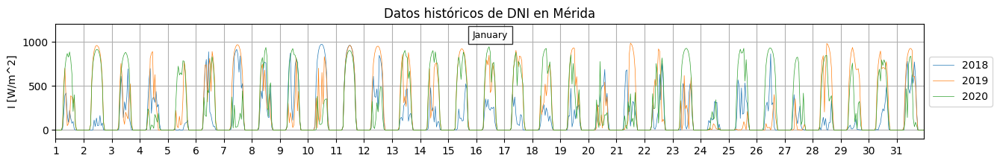

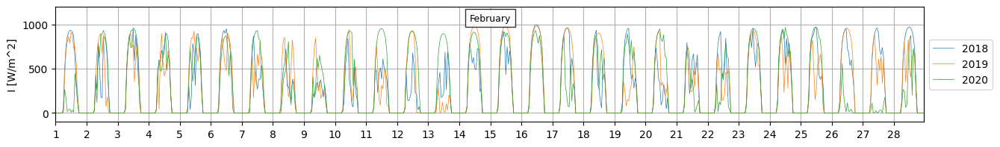

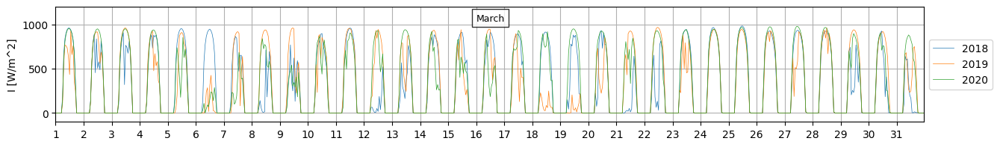

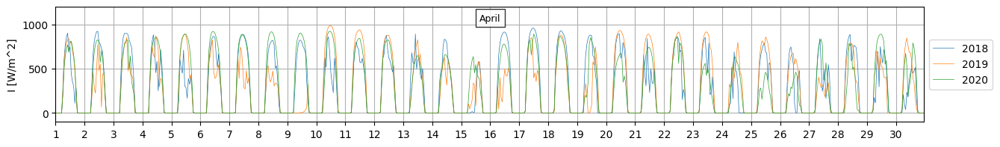

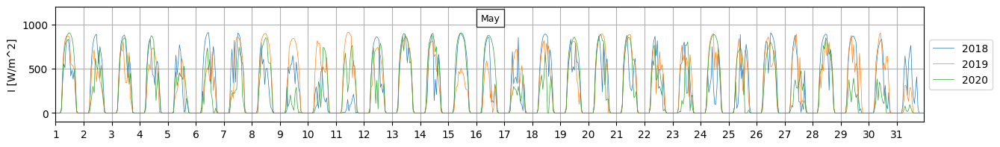

...

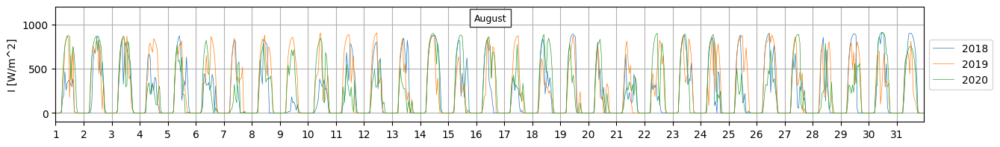

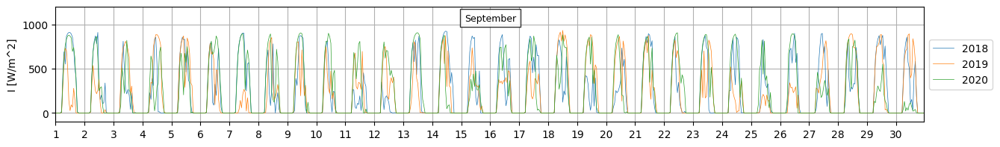

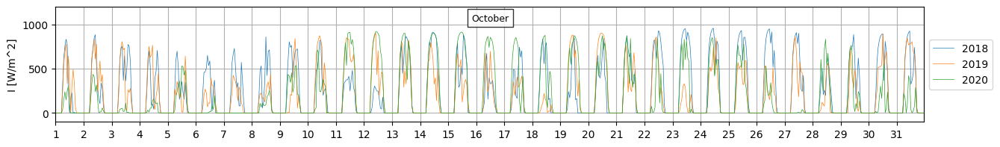

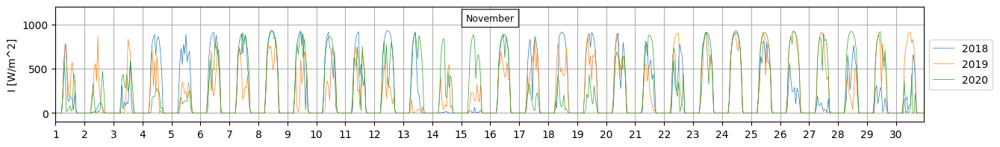

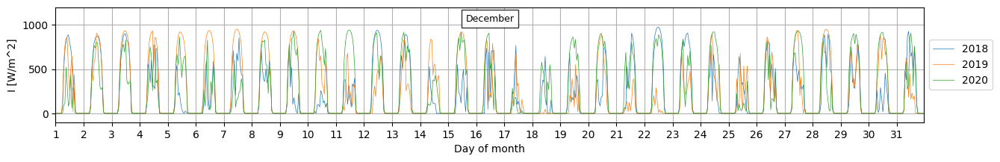

In [8]:
import calendar

def plot_DNI():

    temperature = nrel.groupby(['YEAR','MONTH','DAY','HOUR']).mean().reset_index()[['YEAR','MONTH','DAY','HOUR','DNI']]
    years = temperature.YEAR.unique()
    ylimits = (-100,1200)
    
    for mo in temperature.MONTH.unique():
        
        fig, ax = plt.subplots(figsize=(15,2))
        if mo == 1:
            plt.title('Datos históricos de DNI en Mérida')
        plt.ylim(ylimits)
        ax.grid(True)
        ax.margins(x=0)
        plt.ylabel('I [W/m^2]')

        ticking = temperature.loc[(temperature.HOUR == 0),['DAY']]

        plt.xticks(ticking.index, ticking.DAY)
        for yr in years:
            current = temperature.loc[(temperature.YEAR == yr)&(temperature.MONTH == mo)].reset_index()
            ax.plot(current.index,current.DNI,label=str(yr),linewidth=0.5)

        plt.text(
            len(current.index)/2, 
            np.max(ylimits)*0.94, 
            str(calendar.month_name[mo]),  
            bbox = dict(facecolor = 'white', alpha = 0.8),
            horizontalalignment='center',
            verticalalignment='top',
            fontsize=9
        )
            
        plt.legend(loc="center left",bbox_to_anchor=(1, 0.5))
    plt.xlabel('Day of month')
    plt.show()

plot_DNI()

### **GHI**

Con estas gráficas podemos apreciar que el efecto global de la presencia de obstrucciones y cielos no despejados tienen una contribución negativa en la intensidad de la irradiancia proyectada en el plano horizontal.

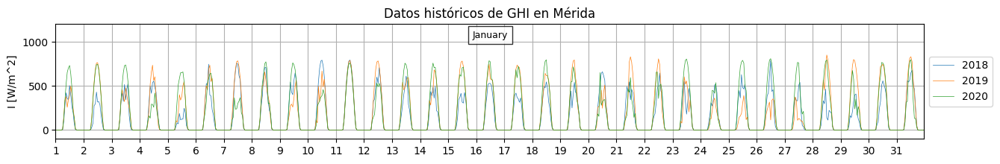

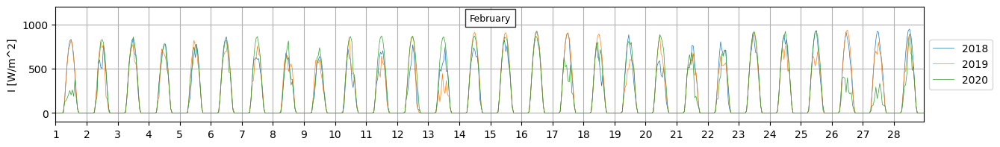

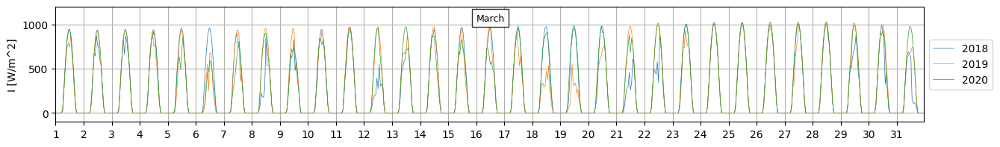

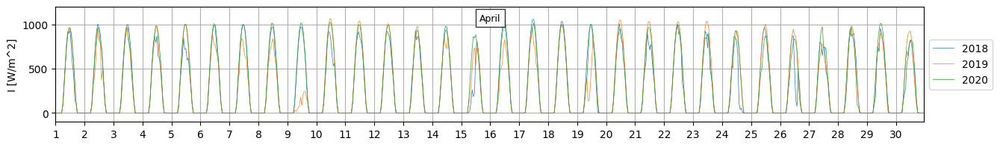

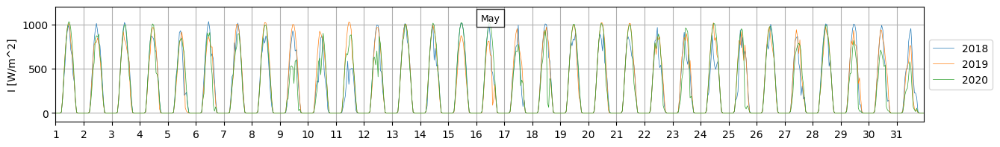

...

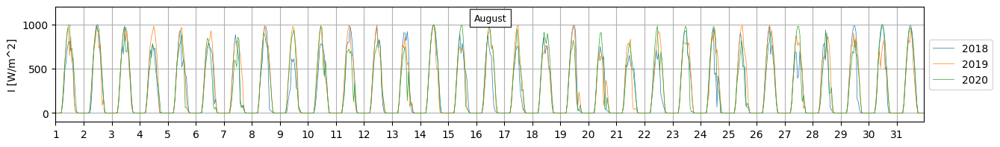

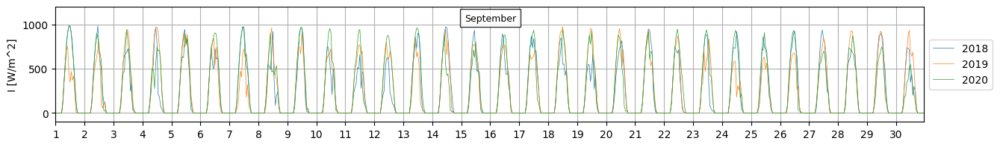

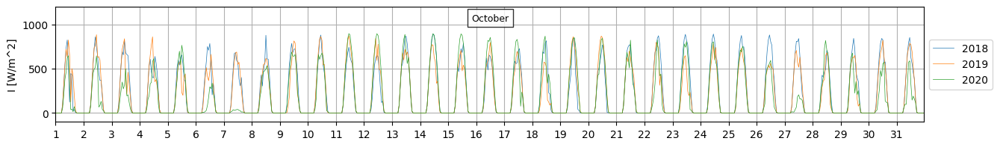

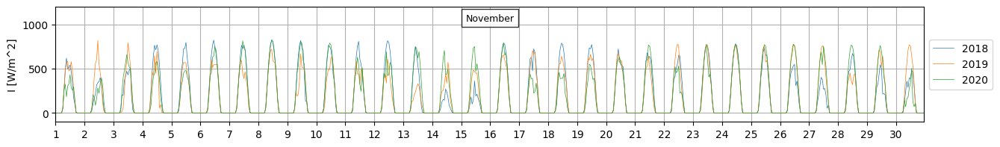

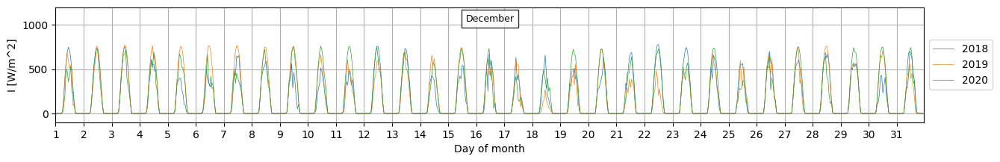

In [9]:
import calendar

def plot_GHI():

    temperature = nrel.groupby(['YEAR','MONTH','DAY','HOUR']).mean().reset_index()[['YEAR','MONTH','DAY','HOUR','GHI']]
    years = temperature.YEAR.unique()
    ylimits = (-100,1200)
    
    for mo in temperature.MONTH.unique():
        
        fig, ax = plt.subplots(figsize=(15,2))
        if mo == 1:
            plt.title('Datos históricos de GHI en Mérida')
        plt.ylim(ylimits)
        ax.grid(True)
        ax.margins(x=0)
        plt.ylabel('I [W/m^2]')

        ticking = temperature.loc[(temperature.HOUR == 0),['DAY']]

        plt.xticks(ticking.index, ticking.DAY)
        for yr in years:
            current = temperature.loc[(temperature.YEAR == yr)&(temperature.MONTH == mo)].reset_index()
            ax.plot(current.index,current.GHI,label=str(yr),linewidth=0.5)

        plt.text(
            len(current.index)/2, 
            np.max(ylimits)*0.94, 
            str(calendar.month_name[mo]),  
            bbox = dict(facecolor = 'white', alpha = 0.8),
            horizontalalignment='center',
            verticalalignment='top',
            fontsize=9
        )
            
        plt.legend(loc="center left",bbox_to_anchor=(1, 0.5))
    plt.xlabel('Day of month')
    plt.show()

plot_GHI()

### **GI**

Lo mismo que fue comentado para la variable anterior es cierto para la irradiancia global también.

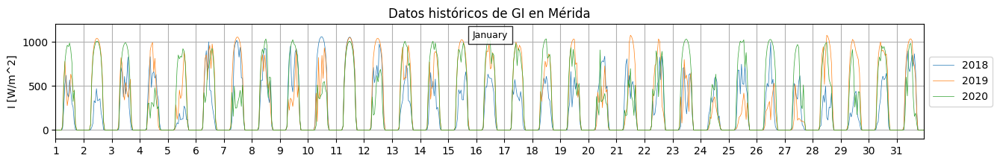

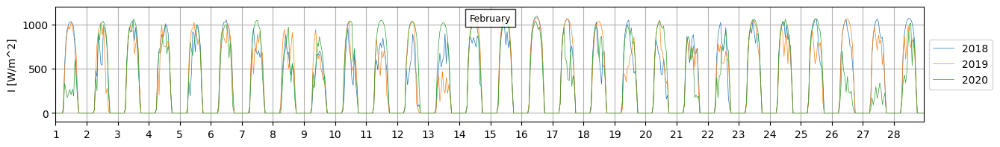

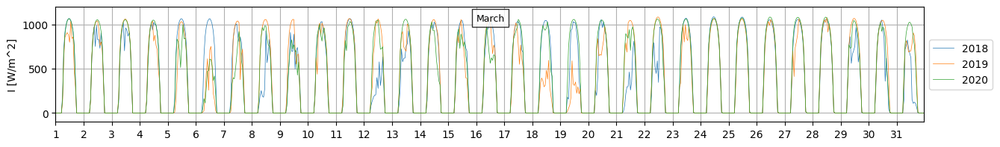

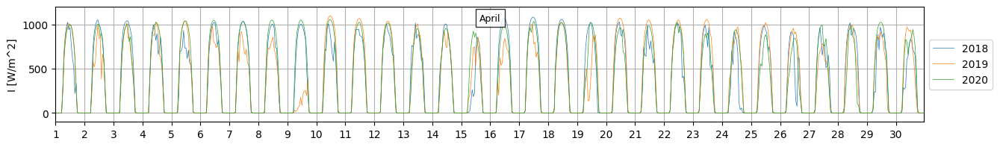

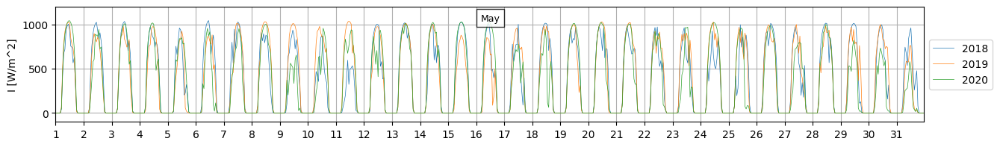

...

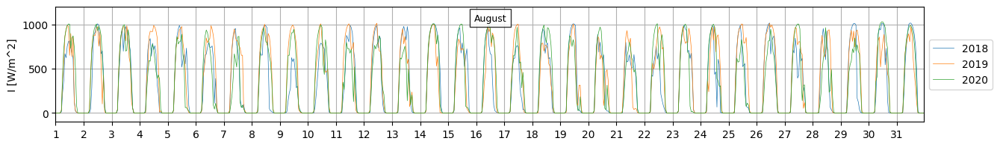

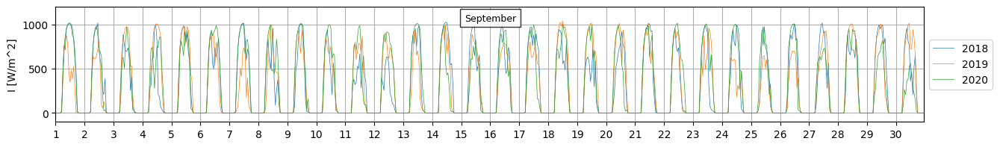

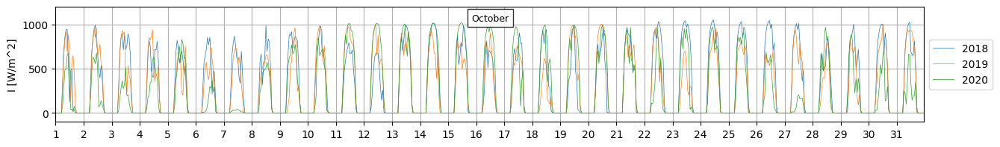

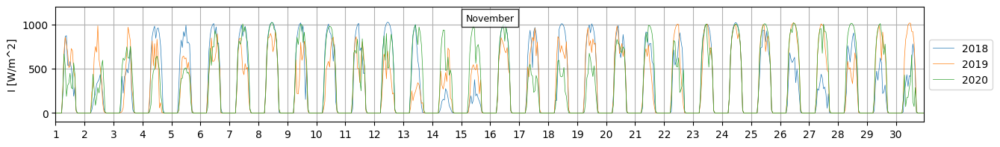

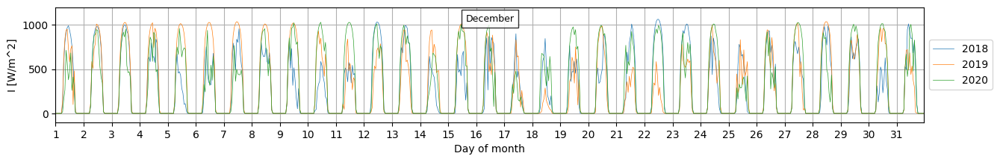

In [10]:
import calendar

def plot_GI():

    temperature = nrel.groupby(['YEAR','MONTH','DAY','HOUR']).mean().reset_index()[['YEAR','MONTH','DAY','HOUR','GI']]
    years = temperature.YEAR.unique()
    ylimits = (-100,1200)
    
    for mo in temperature.MONTH.unique():
        
        fig, ax = plt.subplots(figsize=(15,2))
        if mo == 1:
            plt.title('Datos históricos de GI en Mérida')
        plt.ylim(ylimits)
        ax.grid(True)
        ax.margins(x=0)
        plt.ylabel('I [W/m^2]')

        ticking = temperature.loc[(temperature.HOUR == 0),['DAY']]

        plt.xticks(ticking.index, ticking.DAY)
        for yr in years:
            current = temperature.loc[(temperature.YEAR == yr)&(temperature.MONTH == mo)].reset_index()
            ax.plot(current.index,current.GI,label=str(yr),linewidth=0.5)

        plt.text(
            len(current.index)/2, 
            np.max(ylimits)*0.94, 
            str(calendar.month_name[mo]),  
            bbox = dict(facecolor = 'white', alpha = 0.8),
            horizontalalignment='center',
            verticalalignment='top',
            fontsize=9
        )
            
        plt.legend(loc="center left",bbox_to_anchor=(1, 0.5))
    plt.xlabel('Day of month')
    plt.show()

plot_GI()

### **ALPHA**

Con estas gráficas ilustramos que el ángulo altura solar es una cantidad que obedece una ciclicidad certera. Esto es por la naturaleza cinética de los movimientos planetarios alrededor del sol.

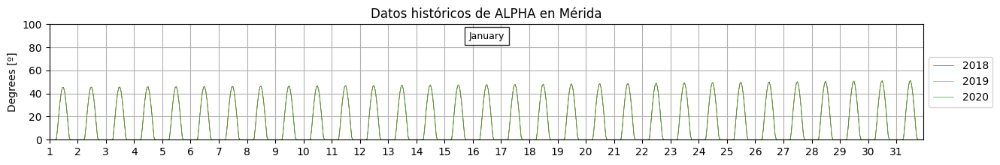

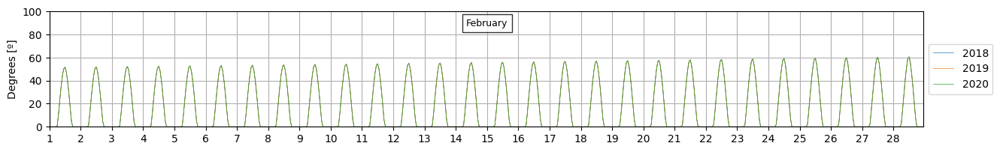

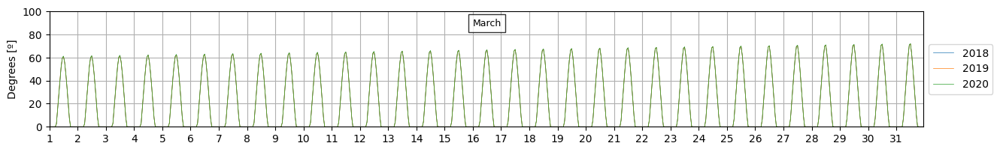

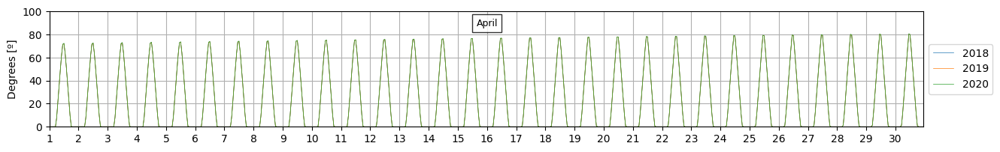

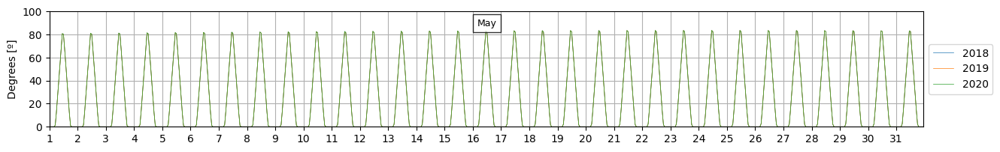

...

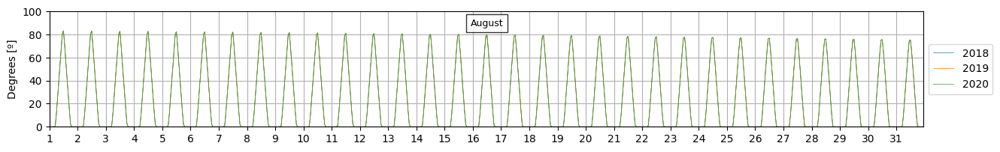

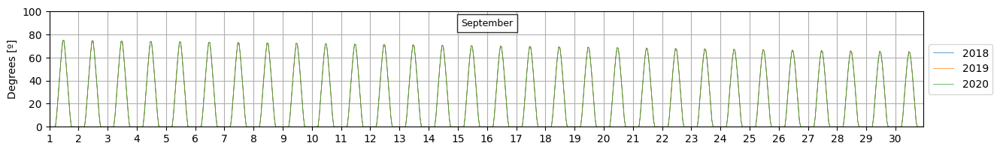

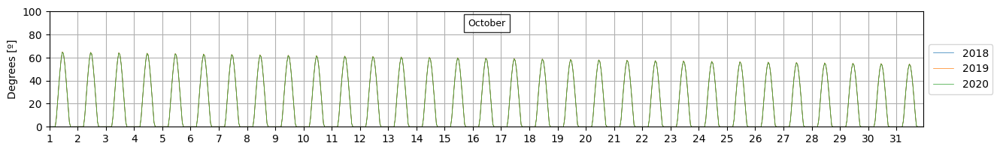

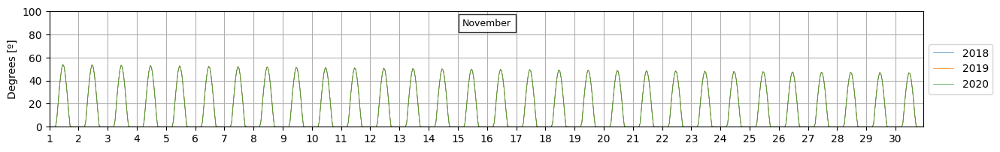

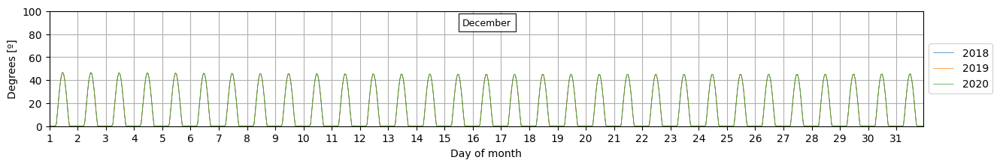

In [11]:
import calendar

def plot_ALPHA():

    temperature = nrel.groupby(['YEAR','MONTH','DAY','HOUR']).mean().reset_index()[['YEAR','MONTH','DAY','HOUR','ALPHA']]
    years = temperature.YEAR.unique()
    ylimits = (0,100)
    
    for mo in temperature.MONTH.unique():
        
        fig, ax = plt.subplots(figsize=(15,2))
        if mo == 1:
            plt.title('Datos históricos de ALPHA en Mérida')
        plt.ylim(ylimits)
        ax.grid(True)
        ax.margins(x=0)
        plt.ylabel('Degrees [º]')

        ticking = temperature.loc[(temperature.HOUR == 0),['DAY']]

        plt.xticks(ticking.index, ticking.DAY)
        for yr in years:
            current = temperature.loc[(temperature.YEAR == yr)&(temperature.MONTH == mo)].reset_index()
            ax.plot(current.index,current.ALPHA,label=str(yr),linewidth=0.5)

        plt.text(
            len(current.index)/2, 
            np.max(ylimits)*0.94, 
            str(calendar.month_name[mo]),  
            bbox = dict(facecolor = 'white', alpha = 0.8),
            horizontalalignment='center',
            verticalalignment='top',
            fontsize=9
        )
            
        plt.legend(loc="center left",bbox_to_anchor=(1, 0.5))
    plt.xlabel('Day of month')
    plt.show()

plot_ALPHA()

### **X_DIF**

La componente difusa es menor e intuitivamente constante durante los periodos diurnos de cielos despejados, y aumenta durante los periodos diurnos con cielos obstruidos.

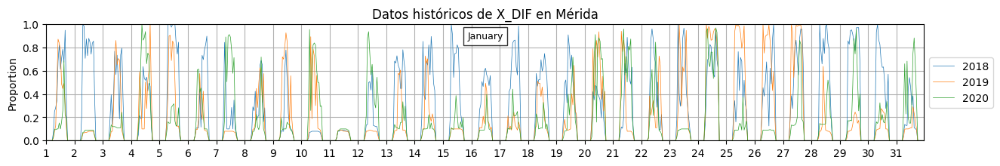

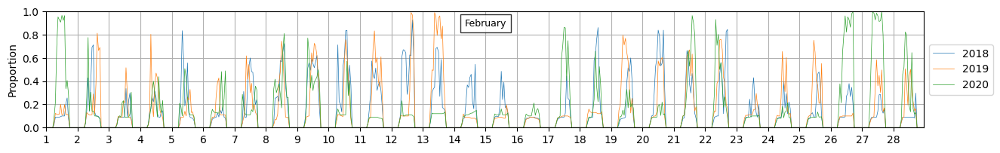

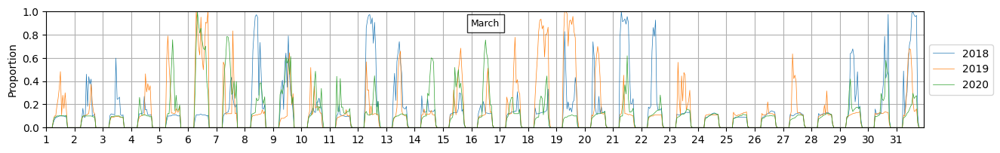

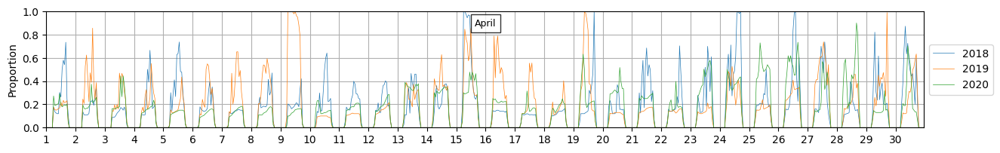

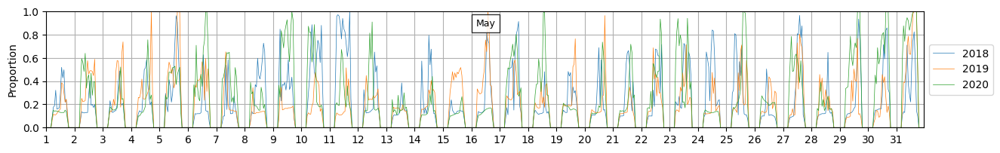

...

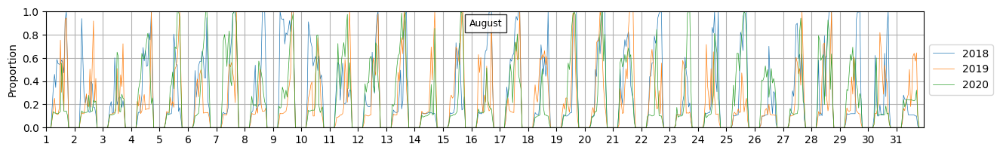

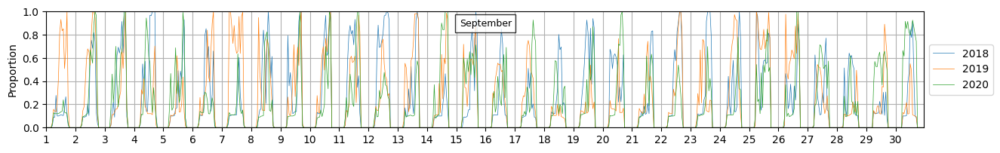

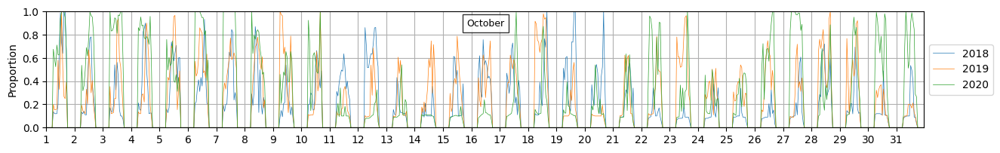

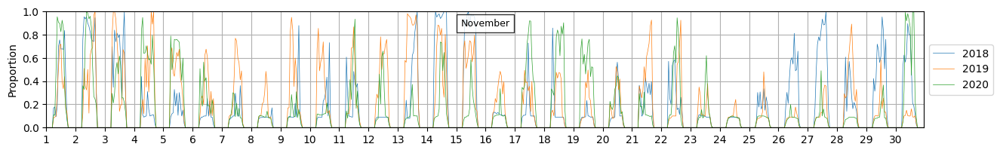

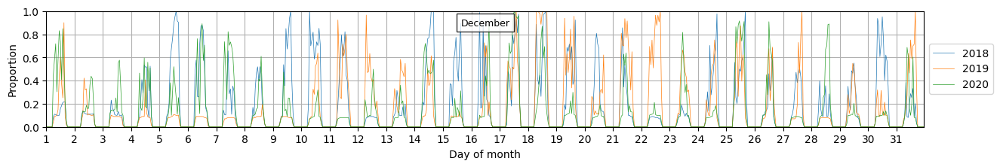

In [12]:
import calendar

def plot_X_DIF():

    temperature = nrel.groupby(['YEAR','MONTH','DAY','HOUR']).mean().reset_index()[['YEAR','MONTH','DAY','HOUR','X_DIF']]
    years = temperature.YEAR.unique()
    ylimits = (0,1)
    
    for mo in temperature.MONTH.unique():
        
        fig, ax = plt.subplots(figsize=(15,2))
        if mo == 1:
            plt.title('Datos históricos de X_DIF en Mérida')
        plt.ylim(ylimits)
        ax.grid(True)
        ax.margins(x=0)
        plt.ylabel('Proportion')

        ticking = temperature.loc[(temperature.HOUR == 0),['DAY']]

        plt.xticks(ticking.index, ticking.DAY)
        for yr in years:
            current = temperature.loc[(temperature.YEAR == yr)&(temperature.MONTH == mo)].reset_index()
            ax.plot(current.index,current.X_DIF,label=str(yr),linewidth=0.5)

        plt.text(
            len(current.index)/2, 
            np.max(ylimits)*0.94, 
            str(calendar.month_name[mo]),  
            bbox = dict(facecolor = 'white', alpha = 0.8),
            horizontalalignment='center',
            verticalalignment='top',
            fontsize=9
        )
            
        plt.legend(loc="center left",bbox_to_anchor=(1, 0.5))
    plt.xlabel('Day of month')
    plt.show()

plot_X_DIF()

### **X_DIR**

La componente directa es mayor durante los periodos diurnos de cielos despejados, y disminuye durante los periodos diurnos con cielos obstruidos. En general, esta es la componente dominante en cuanto no existan cielos despejados en sobremedida.

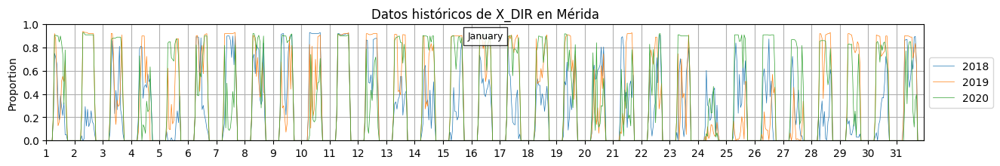

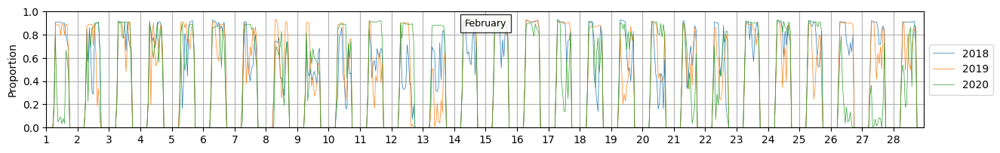

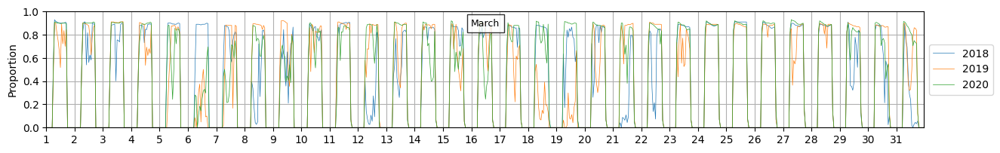

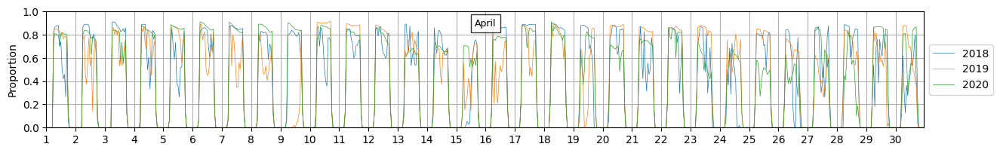

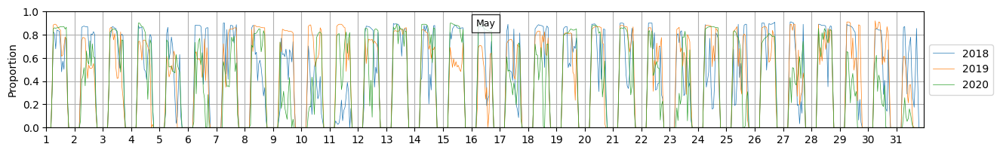

...

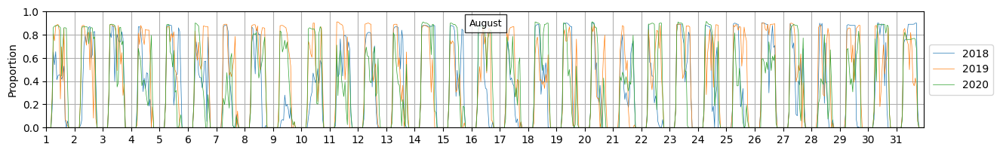

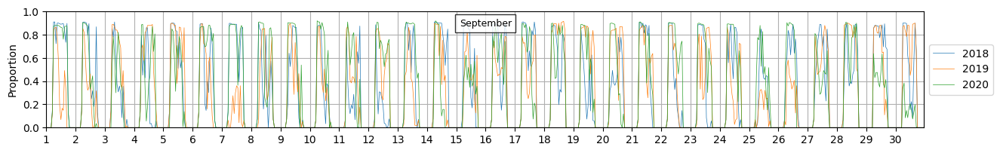

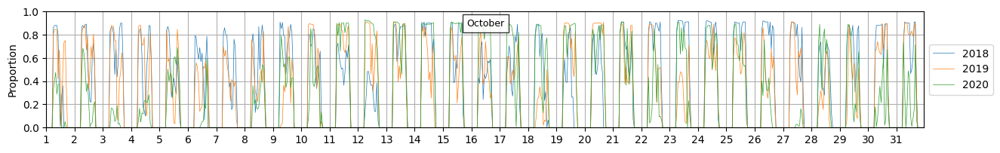

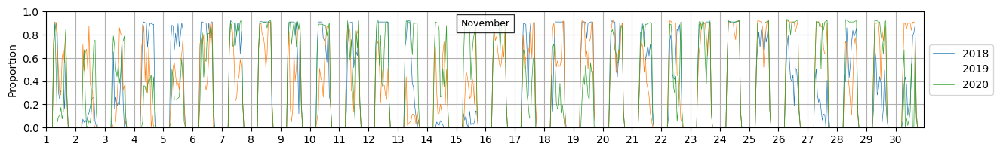

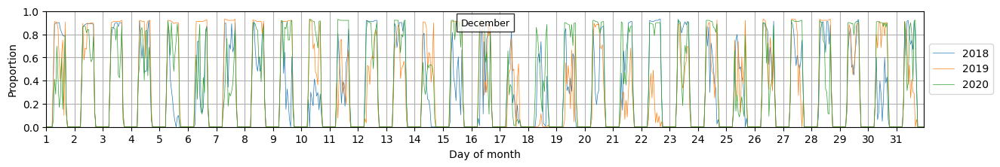

In [13]:
import calendar

def plot_X_DIR():

    temperature = nrel.groupby(['YEAR','MONTH','DAY','HOUR']).mean().reset_index()[['YEAR','MONTH','DAY','HOUR','X_DIR']]
    years = temperature.YEAR.unique()
    ylimits = (0,1)
    
    for mo in temperature.MONTH.unique():
        
        fig, ax = plt.subplots(figsize=(15,2))
        if mo == 1:
            plt.title('Datos históricos de X_DIR en Mérida')
        plt.ylim(ylimits)
        ax.grid(True)
        ax.margins(x=0)
        plt.ylabel('Proportion')

        ticking = temperature.loc[(temperature.HOUR == 0),['DAY']]

        plt.xticks(ticking.index, ticking.DAY)
        for yr in years:
            current = temperature.loc[(temperature.YEAR == yr)&(temperature.MONTH == mo)].reset_index()
            ax.plot(current.index,current.X_DIR,label=str(yr),linewidth=0.5)

        plt.text(
            len(current.index)/2, 
            np.max(ylimits)*0.94, 
            str(calendar.month_name[mo]),  
            bbox = dict(facecolor = 'white', alpha = 0.8),
            horizontalalignment='center',
            verticalalignment='top',
            fontsize=9
        )
            
        plt.legend(loc="center left",bbox_to_anchor=(1, 0.5))
    plt.xlabel('Day of month')
    plt.show()

plot_X_DIR()

## Conclusión

Hemos graficado las series de tiempo para las variables:

- TEMPERATURE
- DHI
- DNI
- GHI
- GI
- ALPHA
- X_DIF
- X_DIR

Y hemos comentado un par de observaciones cualitativas e interpretaciones del comportamiento de los datos visualizados. En general se observa que no parecen existir datos incongruentes o que no parezcan tener explicación lógica; en general los datos exhibían un comportamiento contínuo. Esto nos permite afirmar que se puede continuar trabajando sobre los sets de datos elegido y que se tratan de una fuente confiable de información para ser analizada.